In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings

In [2]:
plt.rcParams['figure.figsize'] = (10,8)

# Creating a dataset for classification

In [11]:
np.random.seed(10)
num_samples = 50
x1 = np.concatenate([np.random.randint(10,50,num_samples-10),
                     np.random.randint(10,20,10),
                     np.random.randint(30,100,num_samples//2),
                     np.random.randint(20,40,num_samples//2)])

x2 = np.concatenate([np.random.randint(10,50,num_samples-10),
                     np.random.randint(50,90,10),
                     np.random.randint(30,100,num_samples//2),
                     np.random.randint(50,70,num_samples//2)])

X = list(zip(x1,x2))
df = pd.DataFrame(X,columns=['f1','f2'])

df['y'] = [0 for _ in range(num_samples)] + [1 for _ in range(num_samples)]

In [19]:
f1 = df["f1"]
f2 = df["f2"]
y = df["y"]

# Create necessary functions

In [31]:
def visualize_decision_boundary(clf, f1=f1, f2=f2, y=y, n_steps=80, cmap='prism', title=None):
     
    xmin, xmax = f1.min() , f1.max()
    ymin, ymax = f2.min() , f2.max()
    
    xstep = (xmax - xmin) / (n_steps - 1)
    ystep = (ymax - ymin) / (n_steps - 1)
    
    xs = np.arange(xmin, xmax, xstep)
    ys = np.arange(ymin, ymax, ystep)
    
    grid_xs, grid_ys = np.meshgrid(xs, ys)
    
    df_grid = pd.DataFrame({'f1':grid_xs.flatten(), 'f2':grid_ys.flatten()})
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        df_grid["pred"] = clf.predict(df_grid[['f1','f2']].values)
        
    ax = df_grid.plot.scatter("f1", "f2", c="pred", cmap=cmap, title=title, colorbar=False, alpha=0.3)
    ax.scatter(f1, f2, c=y, cmap=cmap, marker="o", s=100)

    plt.show()

In [36]:
def visualize_confidence(clf, f1=f1, f2=f2, y=y, n_steps = 80, cmap1="coolwarm", cmap2="prism", title=None):
    
    xmin, xmax = f1.min(), f1.max()
    ymin, ymax = f2.min(), f2.max()
    
    xstep = (xmax - xmin) / (n_steps - 1)
    ystep = (ymax - ymin) / (n_steps - 1)
    
    xs = np.arange(xmin, xmax, xstep)
    ys = np.arange(ymin, ymax, ystep)
    
    grid_xs, grid_ys = np.meshgrid(xs, ys)

    df_grid = pd.DataFrame({"f1": grid_xs.flatten(), "f2": grid_ys.flatten()})
    
    confidence_function = lambda x: clf.predict_proba(x).max(1)
    confcol = "Probability of predicted class"
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        df_grid[confcol] = confidence_function(df_grid[['f1','f2']].values)
    
    ax = df_grid.plot.scatter("f1", "f2", c=confcol, cmap="coolwarm", title=title, colorbar=True, sharex=False, alpha=0.3)
    ax.scatter(f1, f2, c=y, cmap="prism", marker="o", s=100)

    plt.show()

# True labels of our samples

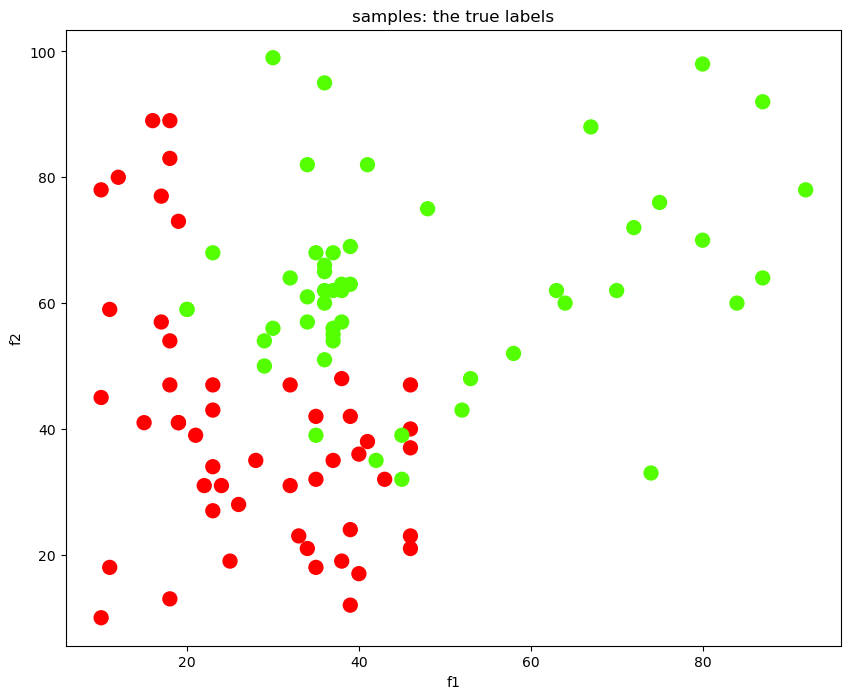

In [16]:
df.plot.scatter('f1', 'f2', c='y', cmap='prism', marker="o", s=100, colorbar=False, title="samples: the true labels" );

# Classifiers decision boundaries

## KNN

In [20]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(df[['f1','f2']], y)

KNeighborsClassifier()

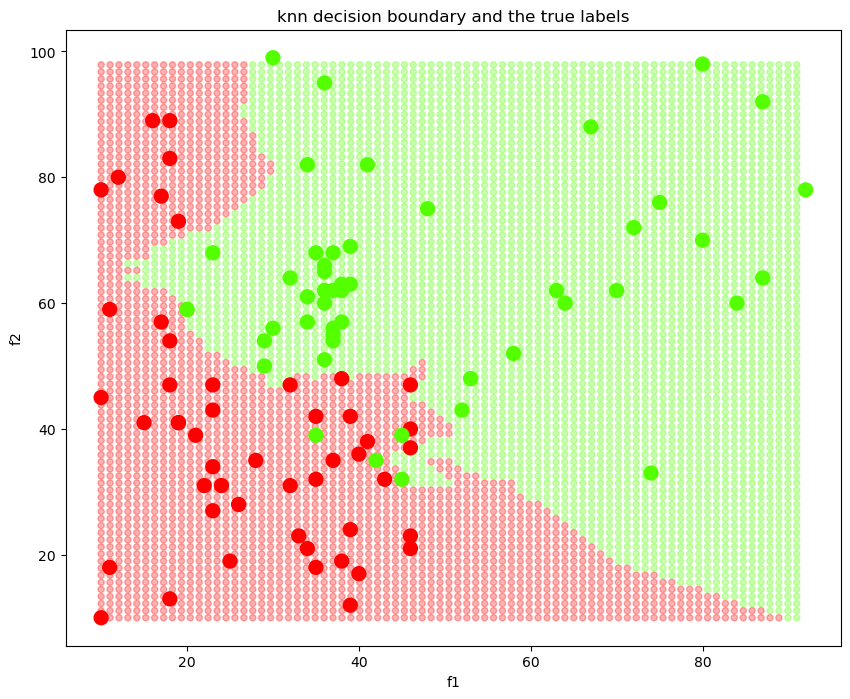

In [32]:
visualize_decision_boundary(knn, title="knn decision boundary and the true labels")

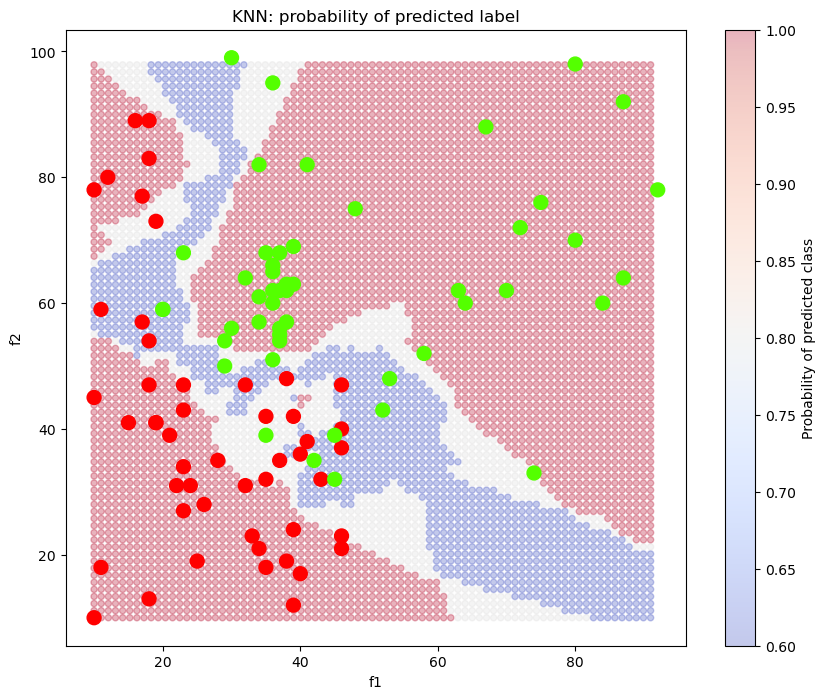

In [37]:
visualize_confidence(knn, title="KNN: probability of predicted label")

#### A look at the sklearn stimator's predictions

In [38]:
knn.predict(df[['f1','f2']])

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], dtype=int64)

In [39]:
probas = knn.predict_proba(df[['f1','f2']])
probas.shape

(100, 2)

#### Barplot of predicted probabilities for individual samples:

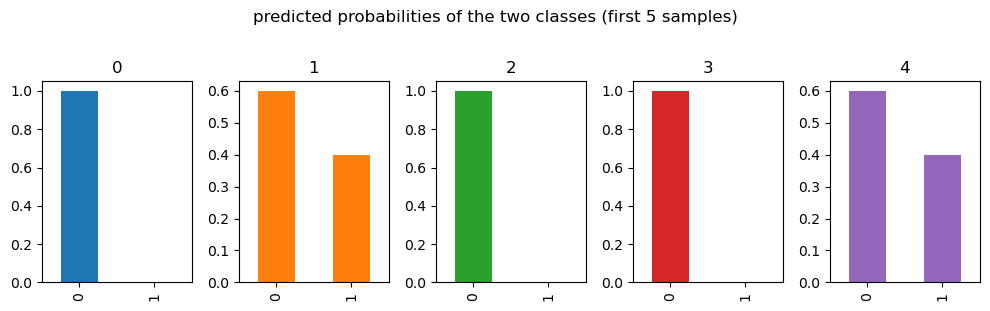

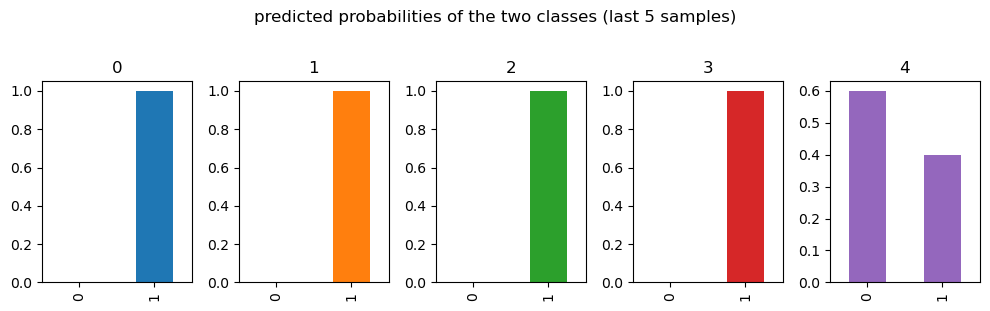

In [40]:
pd.DataFrame(probas[:5]).T.plot.bar(subplots=True, layout=(-1,5), legend=False, figsize=(10,3))
plt.suptitle("predicted probabilities of the two classes (first 5 samples)", y=1.02)
plt.tight_layout()
plt.show()

pd.DataFrame(probas[-5:]).T.plot.bar(subplots=True, layout=(-1,5), legend=False, figsize=(10,3))
plt.suptitle("predicted probabilities of the two classes (last 5 samples)", y=1.02)
plt.tight_layout()
plt.show()

## Logistic regression

In [41]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(df[['f1','f2']],y)

LogisticRegression()

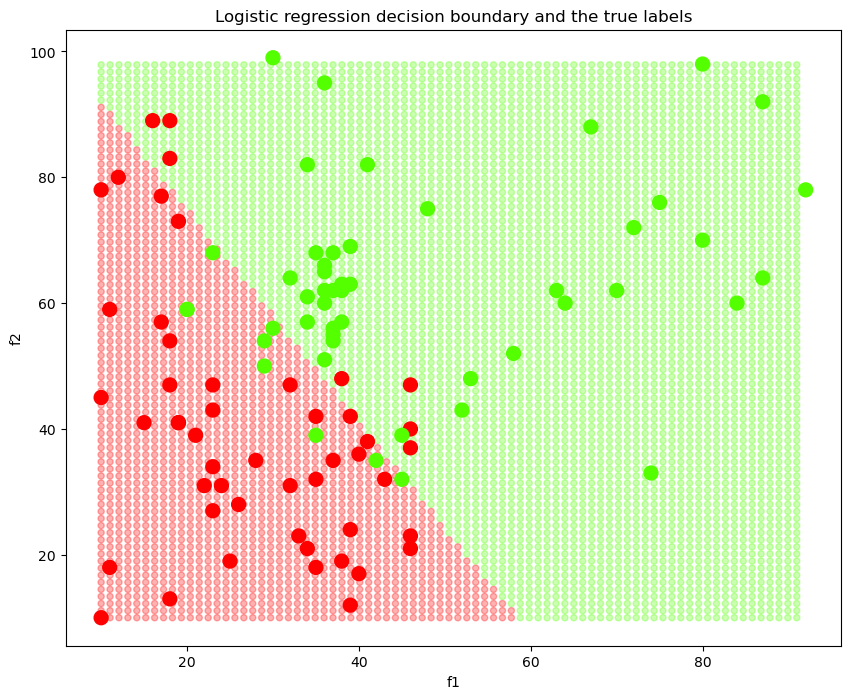

In [42]:
visualize_decision_boundary(logreg, title="Logistic regression decision boundary and the true labels")

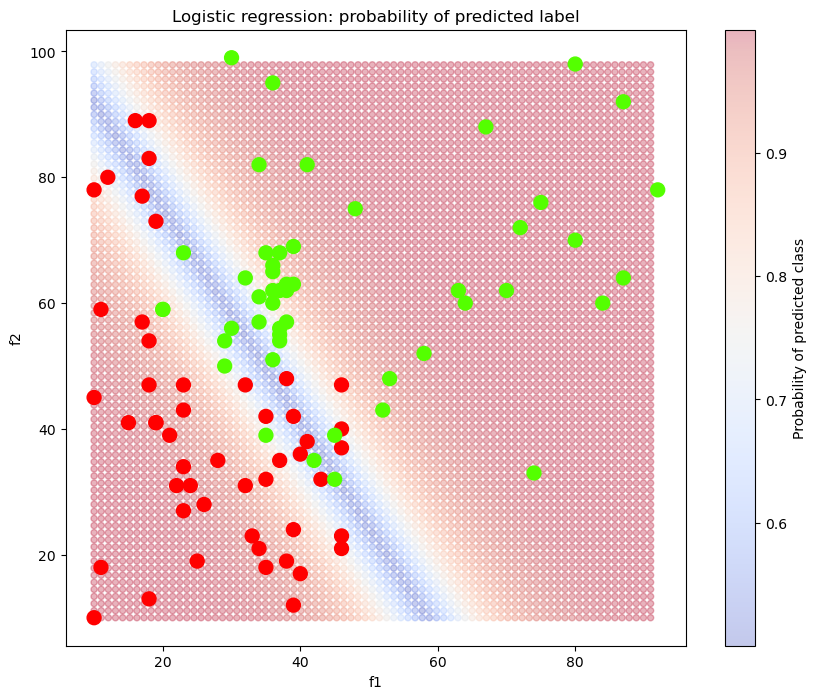

In [43]:
visualize_confidence(logreg, title="Logistic regression: probability of predicted label")

## SVM:Linear

In [44]:
from sklearn.svm import SVC

svm_linear = SVC(kernel='linear',probability=True)
svm_linear.fit(df[['f1','f2']],y)

SVC(kernel='linear', probability=True)

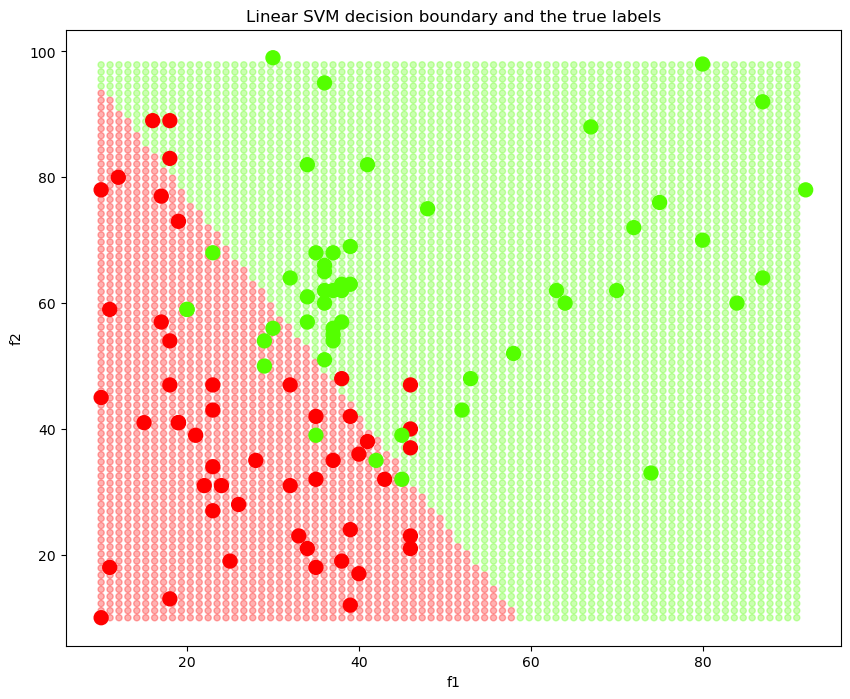

In [45]:
visualize_decision_boundary(svm_linear, title="Linear SVM decision boundary and the true labels")

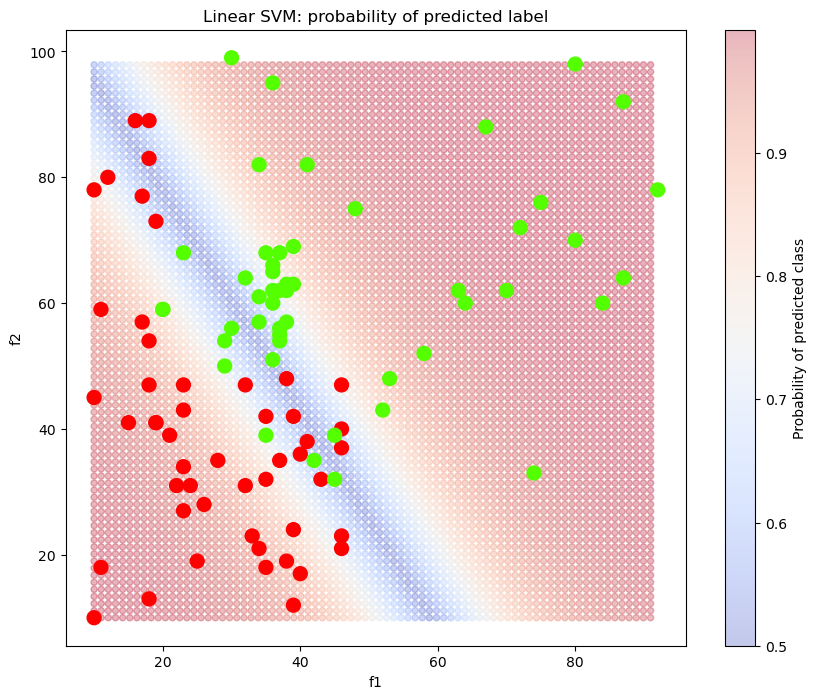

In [46]:
visualize_confidence(svm_linear, title="Linear SVM: probability of predicted label")

## SVM:Polynomial

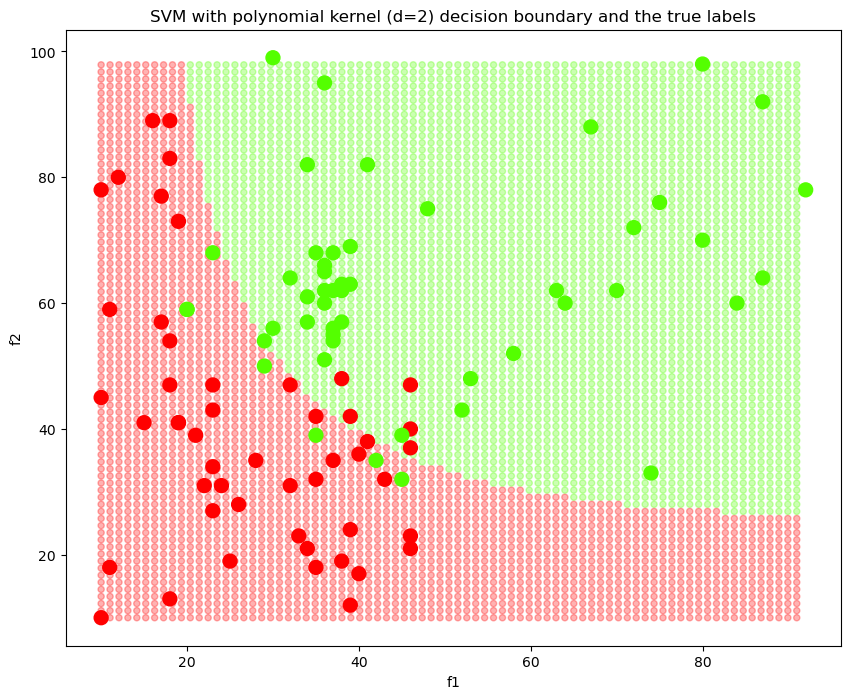

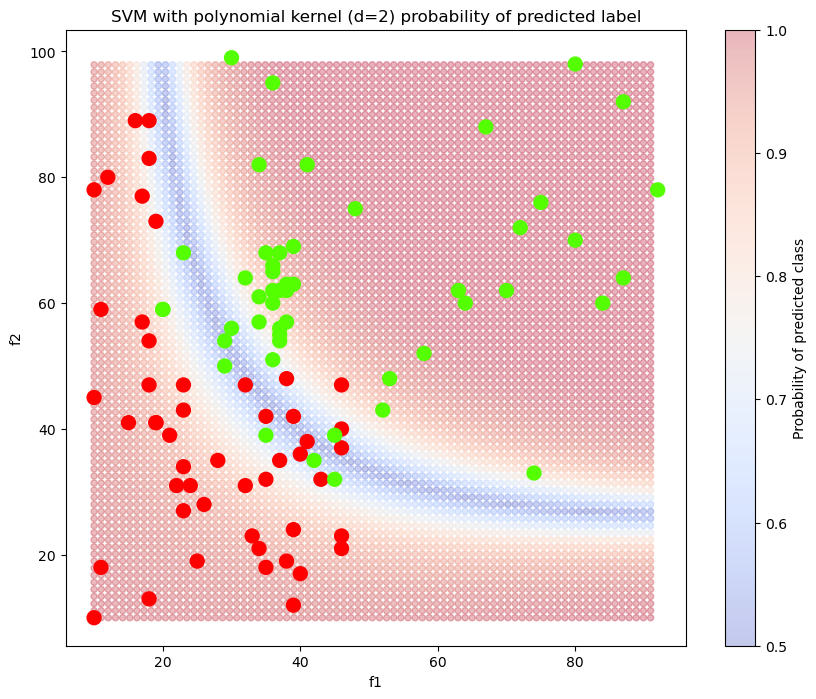

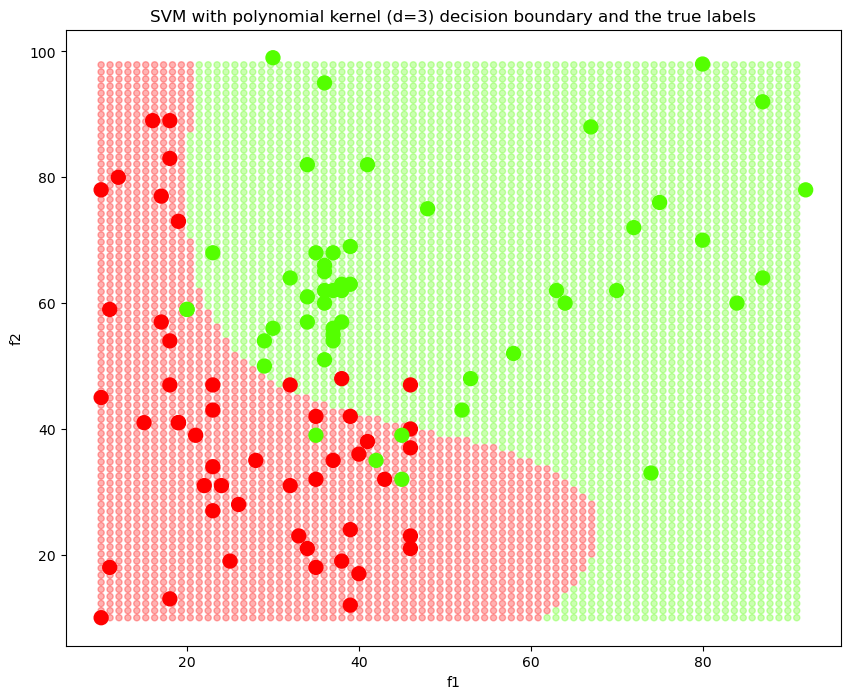

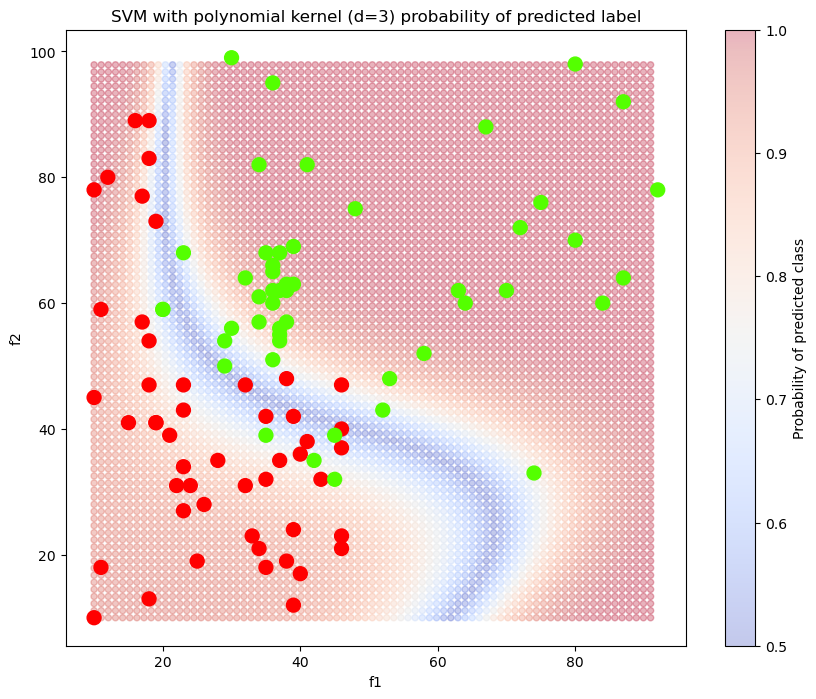

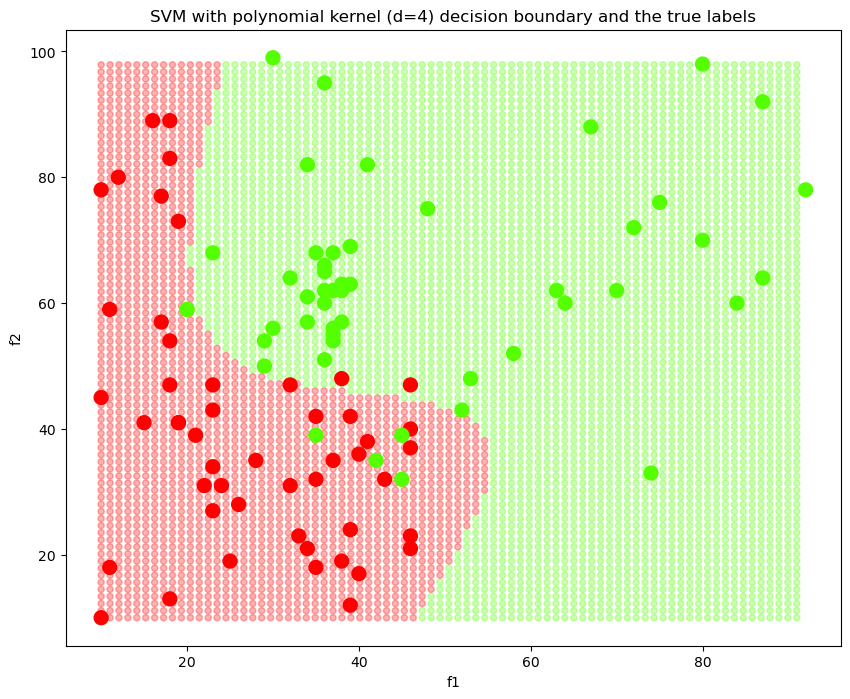

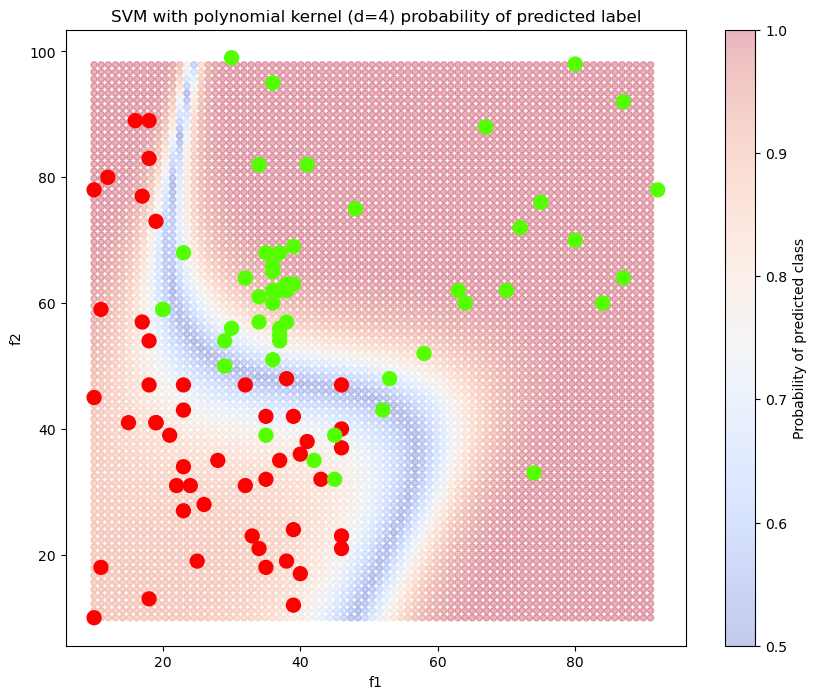

In [50]:
svm_poly_models = dict()
for degree in [2, 3, 4]:
  svm_poly = SVC(kernel="poly", degree=degree, probability=True)
  svm_poly.fit(df[["f1", "f2"]], y)
  svm_poly_models.setdefault(degree, svm_poly)
  visualize_decision_boundary(svm_poly, title=f"SVM with polynomial kernel (d={degree}) decision boundary and the true labels")
  visualize_confidence(svm_poly, title=f"SVM with polynomial kernel (d={degree}) probability of predicted label")

## Decision Tree Classifier

In [53]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

dectree = DecisionTreeClassifier(max_depth=4, min_samples_leaf=5, random_state=10, class_weight="balanced" )
dectree.fit(df[["f1", "f2"]], y)

DecisionTreeClassifier(class_weight='balanced', max_depth=4, min_samples_leaf=5,
                       random_state=10)

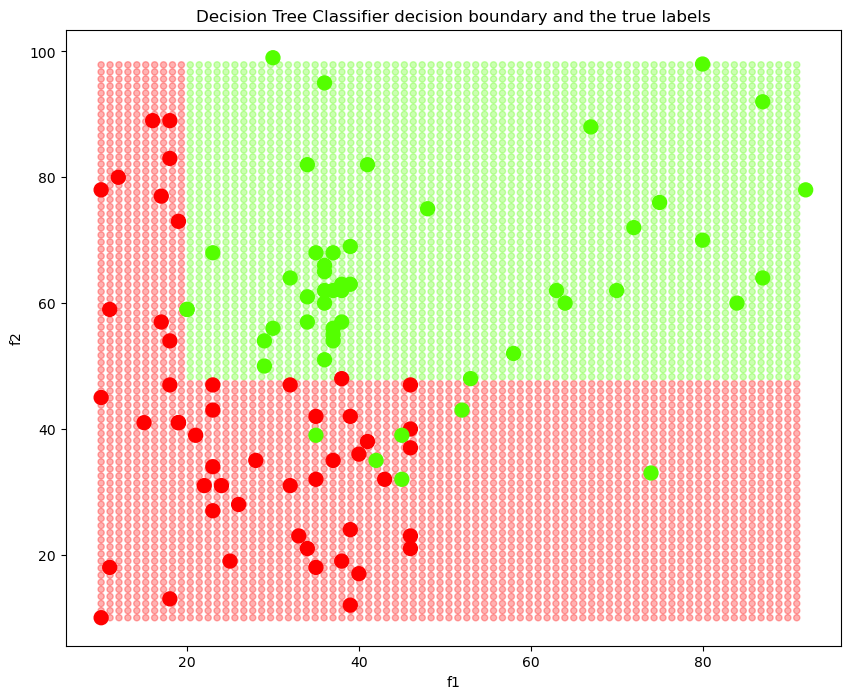

In [54]:
visualize_decision_boundary(dectree, title="Decision Tree Classifier decision boundary and the true labels")

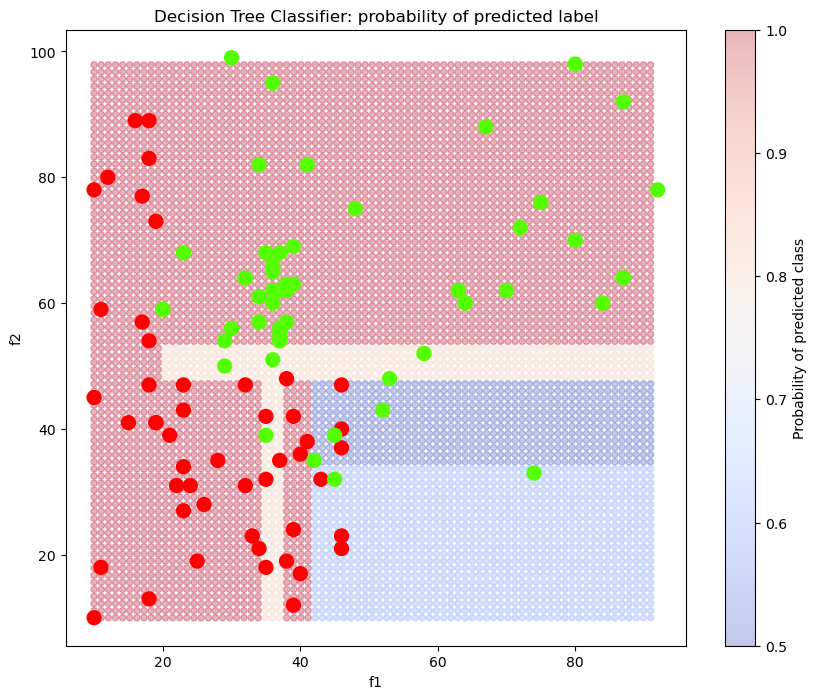

In [55]:
visualize_confidence(dectree, title="Decision Tree Classifier: probability of predicted label")

The decision tree:


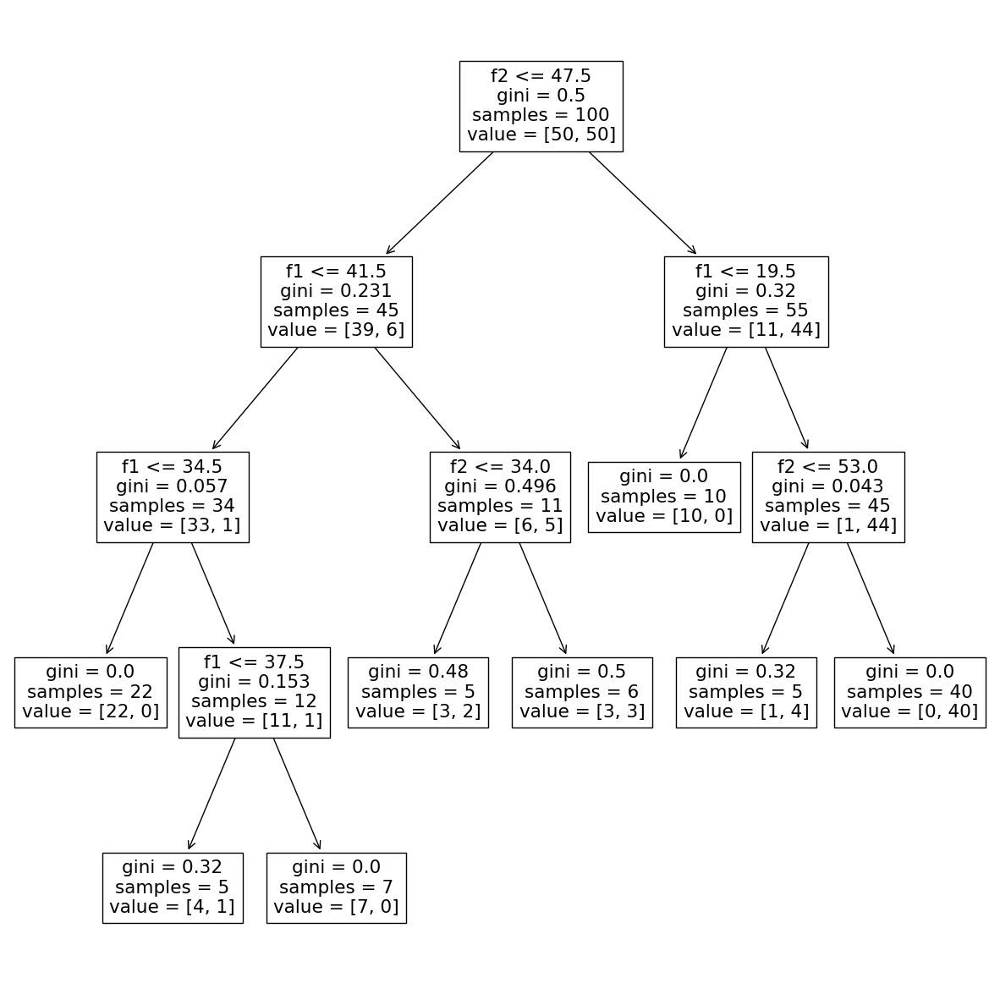

In [56]:
print("The decision tree:")
plt.figure(figsize=(15,15))
tree.plot_tree(dectree, feature_names=dectree.feature_names_in_)
plt.show()

# Measuring Performance

In [58]:
from sklearn import metrics

df['knn_preds'] = knn.predict(df[['f1','f2']])
df['logreg_preds'] = logreg.predict(df[['f1','f2']])
for degree in svm_poly_models:
    df[f'svm_poly_preds{degree}'] = svm_poly_models[degree].predict(df[['f1','f2']])
df['dectree_preds'] = dectree.predict(df[['f1','f2']])

In [59]:
df

,f1,f2,y,knn_preds,logreg_preds,svm_poly_preds2,svm_poly_preds3,svm_poly_preds4,dectree_preds
0,19,41,0,0,0,0,0,0,0
1,46,47,0,0,1,1,1,1,0
2,25,19,0,0,0,0,0,0,0
3,10,10,0,0,0,0,0,0,0
4,38,48,0,0,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...
95,38,63,1,1,1,1,1,1,1
96,37,54,1,1,1,1,1,1,1
97,37,56,1,1,1,1,1,1,1
98,36,60,1,1,1,1,1,1,1


In [64]:
classcolors = {0:'red',1:'green'}
ytrue = df['y'].replace(classcolors)

for modelcol in df.columns[3:]:
    
    ypred = df[modelcol].replace(classcolors)
    confm = pd.DataFrame(metrics.confusion_matrix(yture,ypred,labels=['red','green']),index=['red','green'],columns=['red','green'])
    confm.index.name = 'True'
    confm.columns.name = modelcol
    
    print(f'\nConfusion matrix for {modelcol.replace("_preds", "")}:')
    display(confm)
    print(f'\nClassification report for {modelcol.replace("_preds", "")}:')
    print(metrics.classification_report(ytrue, ypred, labels=["red", "green"]))
    print("---------")


Confusion matrix for knn:


knn_preds,red,green
True,,
red,50,0
green,6,44



Classification report for knn:
              precision    recall  f1-score   support

         red       0.89      1.00      0.94        50
       green       1.00      0.88      0.94        50

    accuracy                           0.94       100
   macro avg       0.95      0.94      0.94       100
weighted avg       0.95      0.94      0.94       100

---------

Confusion matrix for logreg:


logreg_preds,red,green
True,,
red,43,7
green,9,41



Classification report for logreg:
              precision    recall  f1-score   support

         red       0.83      0.86      0.84        50
       green       0.85      0.82      0.84        50

    accuracy                           0.84       100
   macro avg       0.84      0.84      0.84       100
weighted avg       0.84      0.84      0.84       100

---------

Confusion matrix for svm_poly2:


svm_poly_preds2,red,green
True,,
red,45,5
green,8,42



Classification report for svm_poly2:
              precision    recall  f1-score   support

         red       0.85      0.90      0.87        50
       green       0.89      0.84      0.87        50

    accuracy                           0.87       100
   macro avg       0.87      0.87      0.87       100
weighted avg       0.87      0.87      0.87       100

---------

Confusion matrix for svm_poly3:


svm_poly_preds3,red,green
True,,
red,47,3
green,6,44



Classification report for svm_poly3:
              precision    recall  f1-score   support

         red       0.89      0.94      0.91        50
       green       0.94      0.88      0.91        50

    accuracy                           0.91       100
   macro avg       0.91      0.91      0.91       100
weighted avg       0.91      0.91      0.91       100

---------

Confusion matrix for svm_poly4:


svm_poly_preds4,red,green
True,,
red,48,2
green,6,44



Classification report for svm_poly4:
              precision    recall  f1-score   support

         red       0.89      0.96      0.92        50
       green       0.96      0.88      0.92        50

    accuracy                           0.92       100
   macro avg       0.92      0.92      0.92       100
weighted avg       0.92      0.92      0.92       100

---------

Confusion matrix for dectree:


dectree_preds,red,green
True,,
red,49,1
green,6,44



Classification report for dectree:
              precision    recall  f1-score   support

         red       0.89      0.98      0.93        50
       green       0.98      0.88      0.93        50

    accuracy                           0.93       100
   macro avg       0.93      0.93      0.93       100
weighted avg       0.93      0.93      0.93       100

---------
